In [1]:
from icevision.all import *

/root/miniforge-pypy3/envs/icevision/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


## Load Annotations

In [2]:
parser = parsers.VOCBBoxParser(annotations_dir='pascal_voc_annotations/', 
                               images_dir='/workspace/yolo_v8_training/oiv7_full/validation/')

In [3]:
# Parse annotations to create records
train_records, valid_records = parser.parse() # Defaults to 80:20 split
parser.class_map

  0%|          | 0/904 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/904 [00:00<?, ?it/s]

<ClassMap: {'background': 0, 'person': 1}>

In [5]:
image_size = 640
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=720), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [6]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [7]:
print(f"Train on {len(train_ds)} images")
print(f"Validate on {len(valid_ds)} images")

Train on 723 images
Validate on 181 images


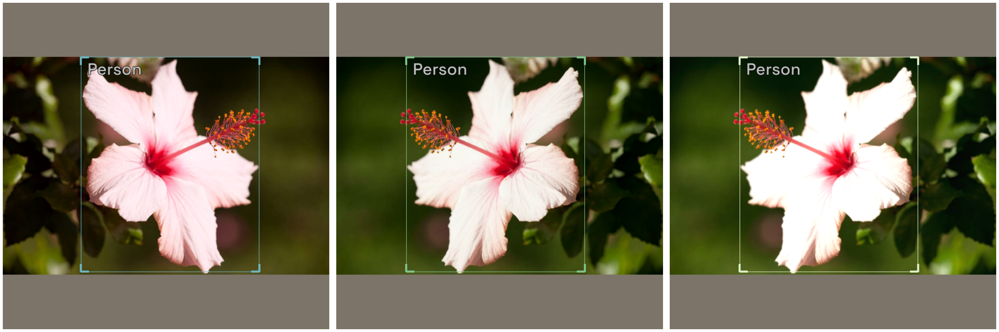

In [8]:
%matplotlib inline
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

## Build Model

In [9]:
model_type = models.mmdet.vfnet
backbone = model_type.backbones.resnet50_fpn_mstrain_2x
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map)) 

  0%|          | 0/131902412 [00:00<?, ?B/s]

2024-04-01 09:37:05,804 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2024-04-01 09:37:05,804 - mmcv - INFO - load model from: torchvision://resnet50
2024-04-01 09:37:05,805 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 108MB/s] 
2024-04-01 09:37:07,096 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2024-04-01 09:37:07,110 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2024-04-01 09:37:07,122 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'vfnet_cls', 'std': 0.01, 'bias_prob': 0.01}

load checkpoint from local path: checkpoints/vfnet/vfnet_r50_fpn_mstrain_2x_coco_20201027-7cc75bd2.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.vfnet_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([1, 256, 3, 3]).
size mismatch for bbox_head.vfnet_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([1]).


In [10]:
train_dl = model_type.train_dl(train_ds, batch_size=16, num_workers=16, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers=16, shuffle=False)

In [11]:
# model_type.show_batch(first(valid_dl), ncols=4)

In [12]:
from fastai.callback.tracker import SaveModelCallback, ShowGraphCallback

In [13]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], 
                                  model=model, 
                                  metrics=metrics,
                                  cbs=[ShowGraphCallback()])

/root/miniforge-pypy3/envs/icevision/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


SuggestedLRs(valley=7.585775892948732e-05)

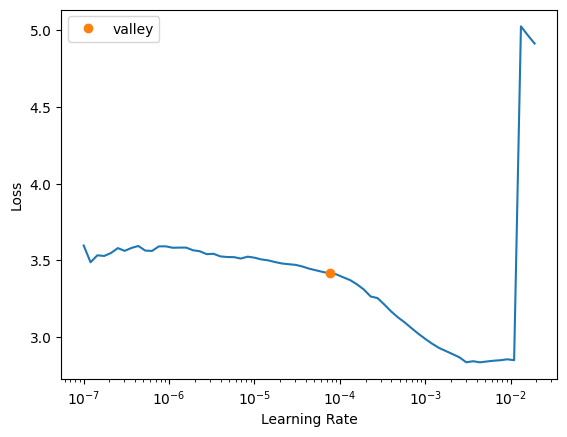

In [14]:
learn.lr_find()

epoch,train_loss,valid_loss,COCOMetric,time
0,1.977451,1.810046,0.261141,00:21


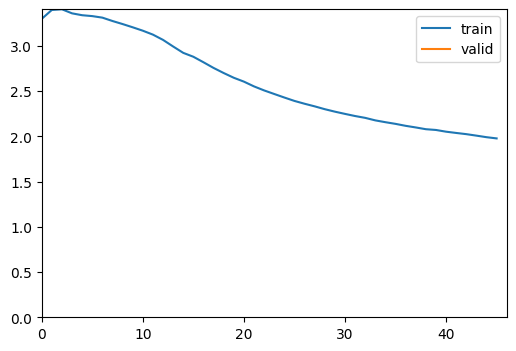

epoch,train_loss,valid_loss,COCOMetric,time
0,1.577311,1.510334,0.385976,00:22
1,1.564197,1.562458,0.370319,00:22
2,1.536898,1.455198,0.396305,00:22
3,1.431756,1.379701,0.457543,00:22
4,1.371676,1.358298,0.456885,00:22


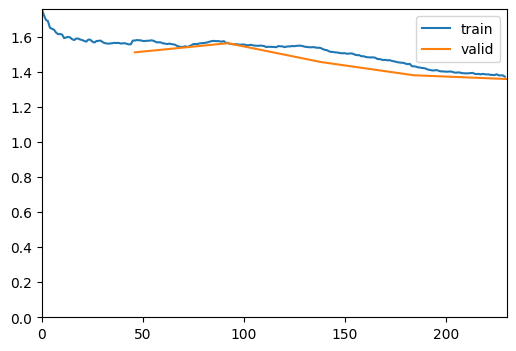

In [15]:
learn.fine_tune(5, 1e-3, freeze_epochs=1)

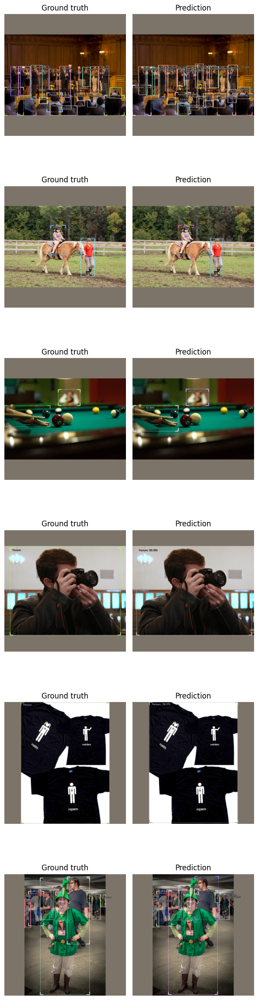

In [16]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

INFO     - Losses returned by model: ['loss_cls', 'loss_bbox'] | icevision.models.interpretation:plot_top_losses:219


  0%|          | 0/181 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

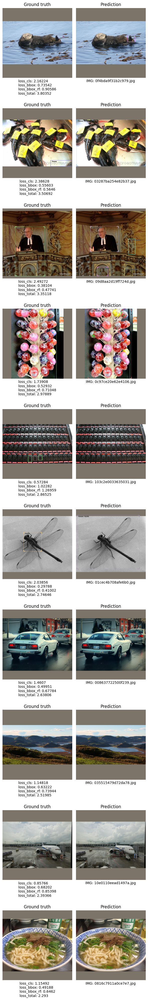

In [17]:
sorted_samples, sorted_preds, losses_stats = model_type.interp.plot_top_losses(model, valid_ds, sort_by="loss_total", n_samples=10, batch_size=32)

In [18]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8)
preds = model_type.predict_from_dl(model=model, infer_dl=infer_dl, keep_images=True)

  0%|          | 0/23 [00:00<?, ?it/s]

In [19]:
len(preds)

181

In [20]:
from icevision.models.checkpoint import *
save_icevision_checkpoint(model,
                        model_name='mmdet.vfnet', 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        img_size=640,
                        classes=parser.class_map.get_classes(),
                        filename='./models/model_checkpoint.pth',
                        meta={'icevision_version': 'master'})

In [21]:
preds[0].as_dict()

{'common': {'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
        

In [22]:
def convert_preds_format(detection_output):
    num_classes = 2
    converted_output = [np.empty((0, 5), dtype=np.float32) for _ in range(num_classes)]
    
    for label_id, score, bbox in zip(detection_output['detection']['label_ids'],
                                     detection_output['detection']['scores'],
                                     detection_output['detection']['bboxes']):
        # Extract bounding box coordinates
        xmin, ymin, xmax, ymax = bbox.xmin, bbox.ymin, bbox.xmax, bbox.ymax
        
        # Append detection to the corresponding class index
        converted_output[label_id] = np.append(converted_output[label_id], [[xmin, ymin, xmax, ymax, score]], axis=0)
    
    return converted_output

In [23]:
convert_preds_format(preds[0].as_dict())

[array([], shape=(0, 5), dtype=float32),
 array([[     240.91,      59.451,      633.92,      588.02,     0.86619],
        [      4.611,      188.38,      299.77,      581.88,     0.84203]], dtype=float32)]

In [24]:
preds[0].ground_truth.as_dict()

{'common': {'record_id': '01b187eac8b7b42d',
  'width': 640,
  'height': 640,
  'filepath': Path('/workspace/yolo_v8_training/oiv7_full/validation/01b187eac8b7b42d.jpg'),
  'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917]],
  
         [[  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          [  0.0055655,  -0.0049019,   0.0081917],
          ...,
    

In [25]:
import numpy as np

def convert_gt_format(data):
    # Extract necessary information from the original format
    bboxes = []
    labels = []
    for detection in data['detection']['bboxes']:
        bboxes.append([detection.xmin, detection.ymin, detection.xmax, detection.ymax])
    labels = data['detection']['label_ids']
    
    seg_map = str(data['common']['filepath']).split('/')[-1]
    filepath = str(data['common']['filepath'])
    img = data['common']['img']
    
    # Create the converted format
    converted_data = {
        'bboxes': np.array(bboxes, dtype=np.float32),
        'labels': np.array(labels),
        'bboxes_ignore': np.empty(shape=(0, 4), dtype=np.float32),
        'masks': [],
        'seg_map': seg_map,
        'filepath': filepath,
        'img': img
    }
    
    return converted_data

In [26]:
convert_gt_format(preds[0].ground_truth.as_dict())

{'bboxes': array([[         15,      187.97,      313.75,         586],
        [     248.75,      66.747,         590,      584.75]], dtype=float32),
 'labels': array([1, 1]),
 'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
 'masks': [],
 'seg_map': '01b187eac8b7b42d.jpg',
 'filepath': '/workspace/yolo_v8_training/oiv7_full/validation/01b187eac8b7b42d.jpg',
 'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917]],
 
        [[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0

In [27]:
label = convert_gt_format(preds[0].ground_truth.as_dict())

with open('label.pkl', 'wb') as f:
    pickle.dump(label, f)

In [28]:
predictions = []
labels = []

# Convert preds and gt into a list

for pred in preds:
    p = pred.as_dict()

    p = convert_preds_format(p)


    l = pred.ground_truth.as_dict()
    l = convert_gt_format(l)

    predictions.append(p)
    labels.append(l)



In [29]:
len(labels)

181

In [30]:
len(predictions)

181

In [31]:
predictions[0]

[array([], shape=(0, 5), dtype=float32),
 array([[     240.91,      59.451,      633.92,      588.02,     0.86619],
        [      4.611,      188.38,      299.77,      581.88,     0.84203]], dtype=float32)]

In [32]:
labels[0]

{'bboxes': array([[         15,      187.97,      313.75,         586],
        [     248.75,      66.747,         590,      584.75]], dtype=float32),
 'labels': array([1, 1]),
 'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
 'masks': [],
 'seg_map': '01b187eac8b7b42d.jpg',
 'filepath': '/workspace/yolo_v8_training/oiv7_full/validation/01b187eac8b7b42d.jpg',
 'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917]],
 
        [[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0

In [34]:
from cleanlab.object_detection.filter import find_label_issues
from cleanlab.object_detection.rank import (
    _separate_label,
    _separate_prediction,
    get_label_quality_scores,
    issues_from_scores,
)
from cleanlab.object_detection.summary import visualize

label_issue_idx = find_label_issues(labels, predictions, return_indices_ranked_by_score=True)

num_examples_to_show = 10
label_issue_idx[:num_examples_to_show]

Pruning 0 predictions out of 166 using threshold==0.0. These predictions are no longer considered as potential candidates for identifying label issues as their similarity with the given labels is no longer considered.


array([ 54,   1, 115,  86, 125, 114, 129,  90, 168,  48])

In [35]:
scores = get_label_quality_scores(labels, predictions)
scores[:num_examples_to_show]

issue_idx = issues_from_scores(scores, threshold=0.5)  # lower threshold will return fewer (but more confident) label issues
issue_idx[:num_examples_to_show], scores[issue_idx][:num_examples_to_show]

Pruning 0 predictions out of 166 using threshold==0.0. These predictions are no longer considered as potential candidates for identifying label issues as their similarity with the given labels is no longer considered.


(array([ 54,   1, 115,  86, 125, 114, 129,  90, 168,  48]),
 array([    0.10714,     0.15251,     0.19338,     0.19423,     0.24985,     0.28973,     0.30926,     0.31838,     0.32107,     0.32717]))

In [41]:
label.keys()

dict_keys(['bboxes', 'labels', 'bboxes_ignore', 'masks', 'seg_map', 'filepath', 'img'])

In [42]:
label

{'bboxes': array([[     189.77,       21.25,       448.6,         635],
        [     246.67,      60.625,      305.43,      194.38],
        [     188.52,       83.75,      256.04,      241.25],
        [      461.1,      108.75,      505.49,      241.25],
        [     127.26,      91.875,      206.65,      273.12],
        [        106,      133.12,      137.26,      283.12],
        [     434.22,         100,       463.6,       152.5],
        [     331.07,      15.625,      447.98,      369.38],
        [     506.12,      111.88,      532.37,      174.38]], dtype=float32),
 'labels': array([1, 1, 1, 1, 1, 1, 1, 1, 1]),
 'bboxes_ignore': array([], shape=(0, 4), dtype=float32),
 'masks': [],
 'seg_map': '0ccdcc825086803a.jpg',
 'filepath': '/workspace/yolo_v8_training/oiv7_full/validation/0ccdcc825086803a.jpg',
 'img': array([[[  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         [  0.0055655,  -0.0049019,   0.0081917],
         ...,
   

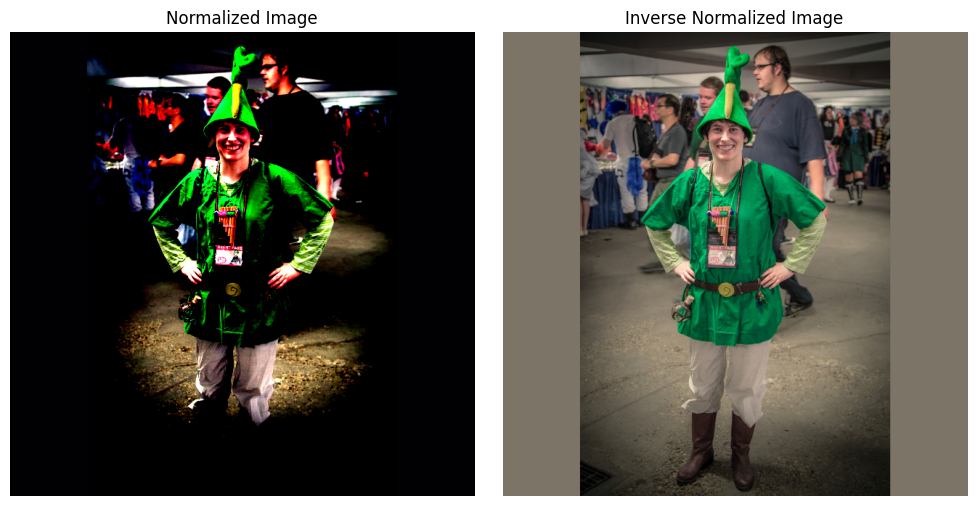

In [70]:
image = label['img']

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

inverse_normalize = tfms.A.Normalize(mean=[-m/s for m, s in zip(mean, std)], std=[1/s for s in std],
                                     always_apply=True, max_pixel_value=1.0)

inverse_normalized_image = (inverse_normalize(image=image)['image']*255).astype(np.uint8)

# # Display the original normalized image and the inverse normalized image
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# ax1.imshow(image)
# ax1.set_title('Normalized Image')
# ax1.axis('off')

# ax2.imshow(inverse_normalized_image)
# ax2.set_title('Inverse Normalized Image')
# ax2.axis('off')

# plt.tight_layout()
# plt.show()

/workspace/yolo_v8_training/oiv7_full/validation/0c97ce20e62e4106.jpg | idx 1 | label quality score: 0.1525112563461654 | is issue: True


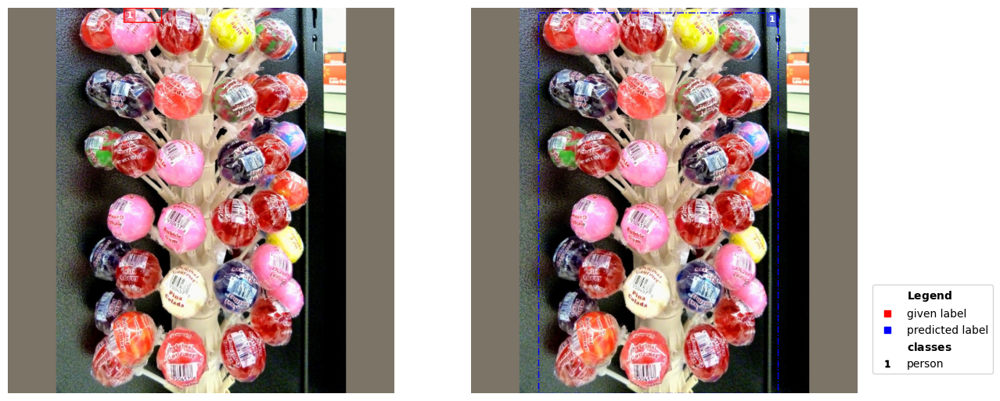

In [74]:
issue_to_visualize = issue_idx[1]  # change this to view other images
class_names = {"1": "person"}

IMAGE_PATH =  '/workspace/yolo_v8_training/oiv7_full/validation/'

label = labels[issue_to_visualize]
prediction = predictions[issue_to_visualize]
score = scores[issue_to_visualize]
image_path = IMAGE_PATH + label['seg_map']

image = label['img']

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

inverse_normalize = tfms.A.Normalize(mean=[-m/s for m, s in zip(mean, std)], std=[1/s for s in std],
                                     always_apply=True, max_pixel_value=1.0)

inverse_normalized_image = (inverse_normalize(image=image)['image']*255).astype(np.uint8)

print(image_path, '| idx', issue_to_visualize , '| label quality score:', score, '| is issue: True')
visualize(inverse_normalized_image, label=label, prediction=prediction, class_names=class_names, overlay=False)

/workspace/yolo_v8_training/oiv7_full/validation/0f59887e03b62121.jpg | idx 54 | label quality score: 0.10713802146110385 | is issue: True


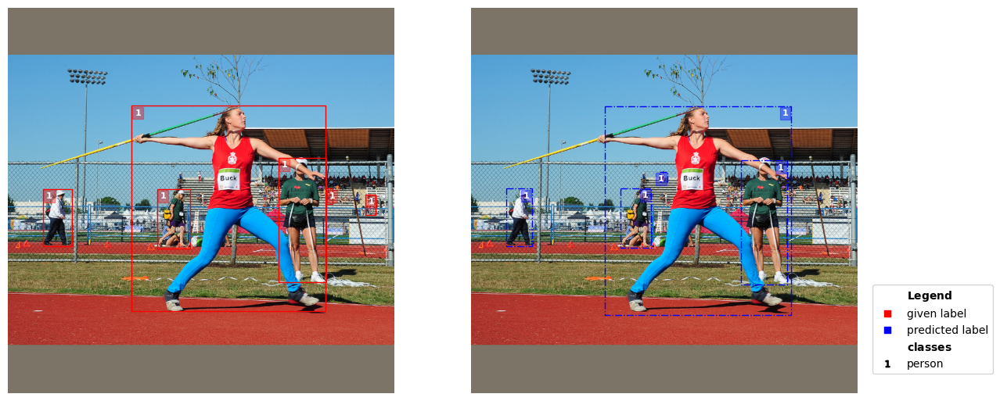

/workspace/yolo_v8_training/oiv7_full/validation/0c97ce20e62e4106.jpg | idx 1 | label quality score: 0.1525112563461654 | is issue: True


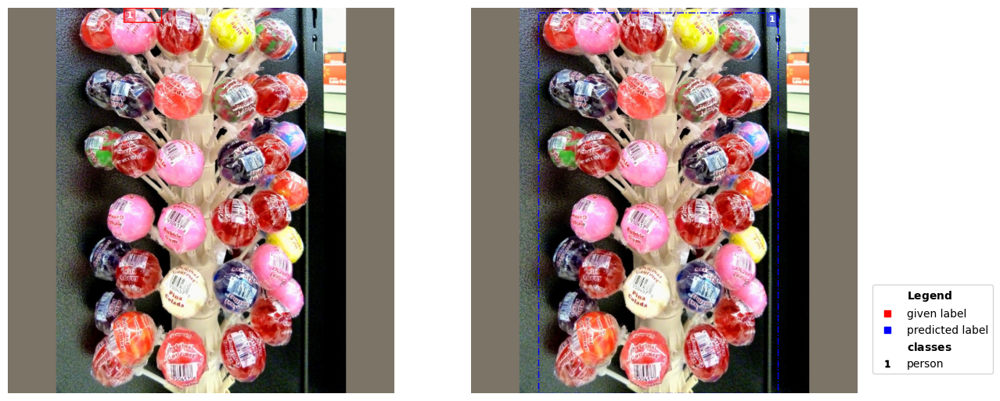

/workspace/yolo_v8_training/oiv7_full/validation/0a8657e8b5c9d7bb.jpg | idx 115 | label quality score: 0.19338110337144934 | is issue: True


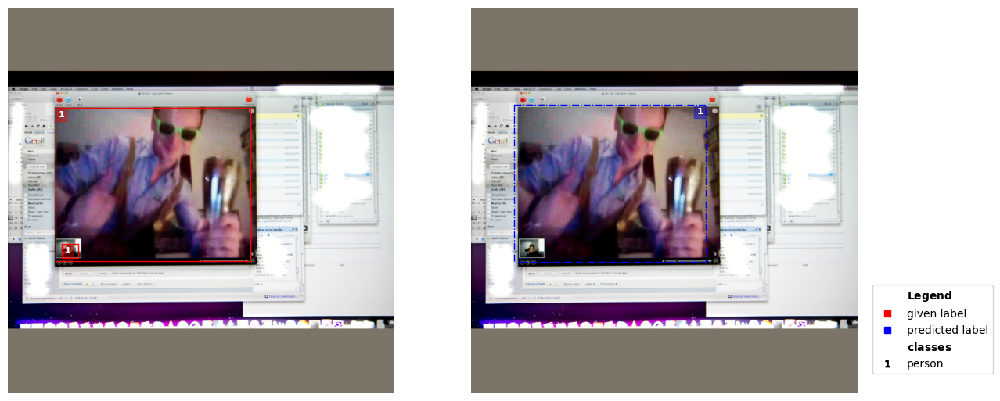

/workspace/yolo_v8_training/oiv7_full/validation/02c94402476ac94c.jpg | idx 86 | label quality score: 0.19422556558269521 | is issue: True


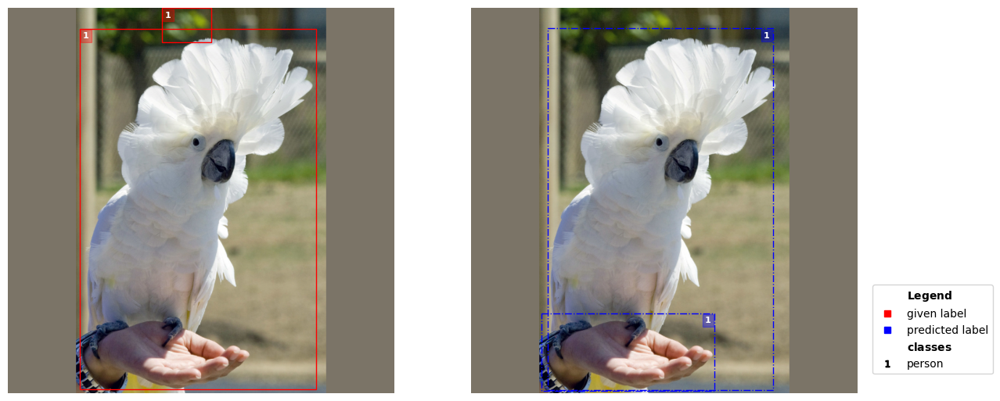

/workspace/yolo_v8_training/oiv7_full/validation/08bc48ffae1a678a.jpg | idx 125 | label quality score: 0.2498544855854009 | is issue: True


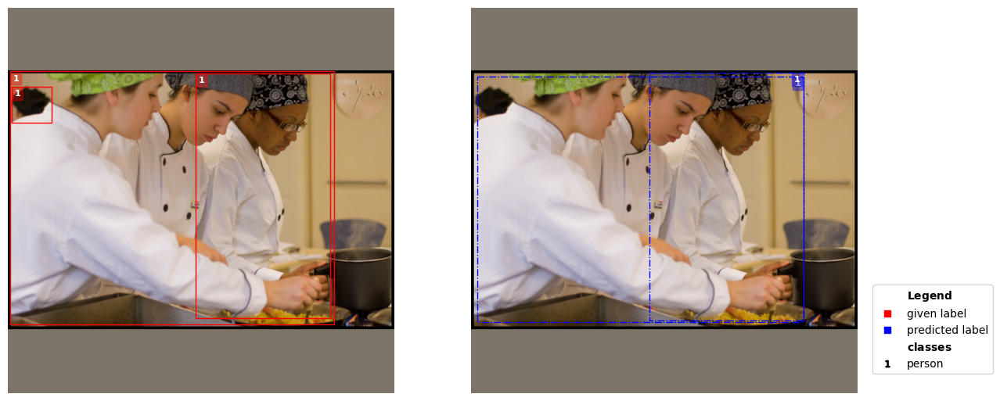

/workspace/yolo_v8_training/oiv7_full/validation/0ccdcc825086803a.jpg | idx 114 | label quality score: 0.28973477353658206 | is issue: True


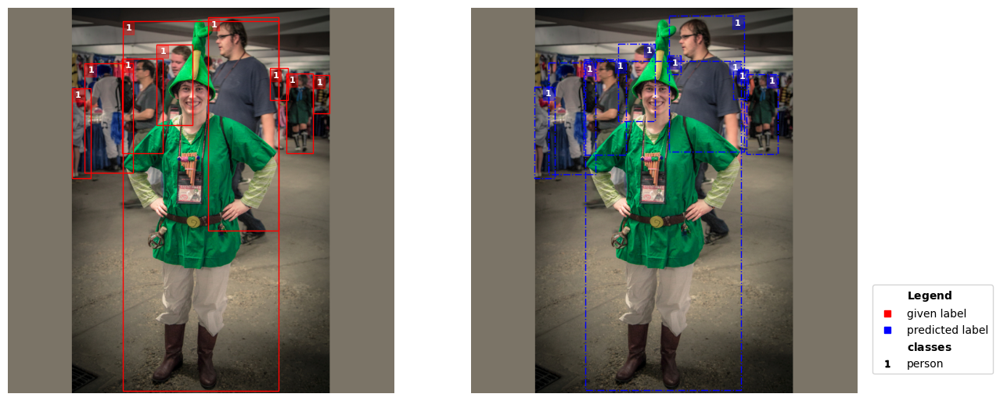

/workspace/yolo_v8_training/oiv7_full/validation/00c9616a917be867.jpg | idx 129 | label quality score: 0.30925575797248034 | is issue: True


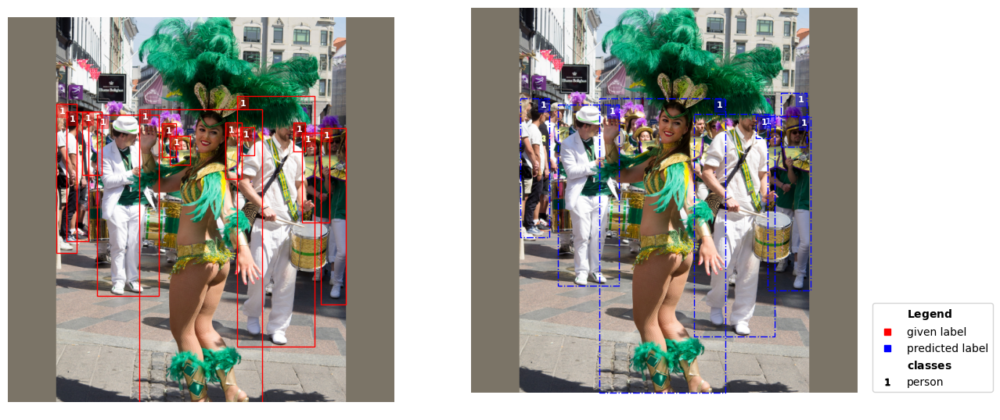

/workspace/yolo_v8_training/oiv7_full/validation/09ea349ee555b61d.jpg | idx 90 | label quality score: 0.31837778384317333 | is issue: True


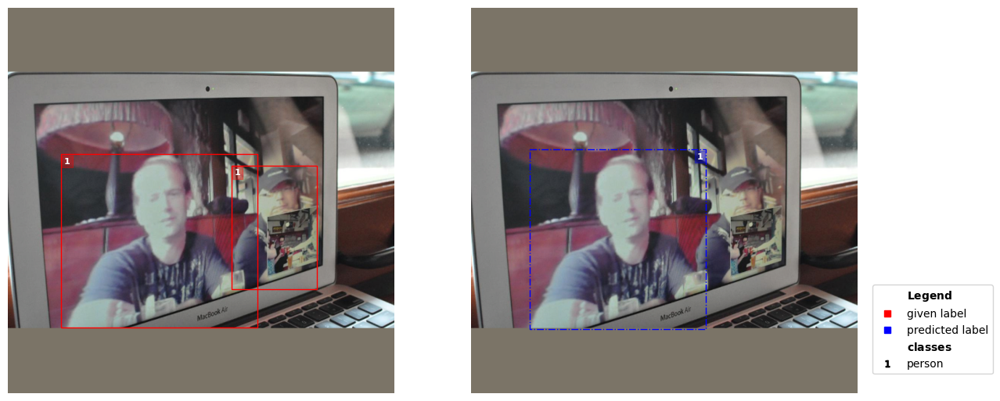

/workspace/yolo_v8_training/oiv7_full/validation/0305a25d76378afd.jpg | idx 168 | label quality score: 0.3210689858406233 | is issue: True


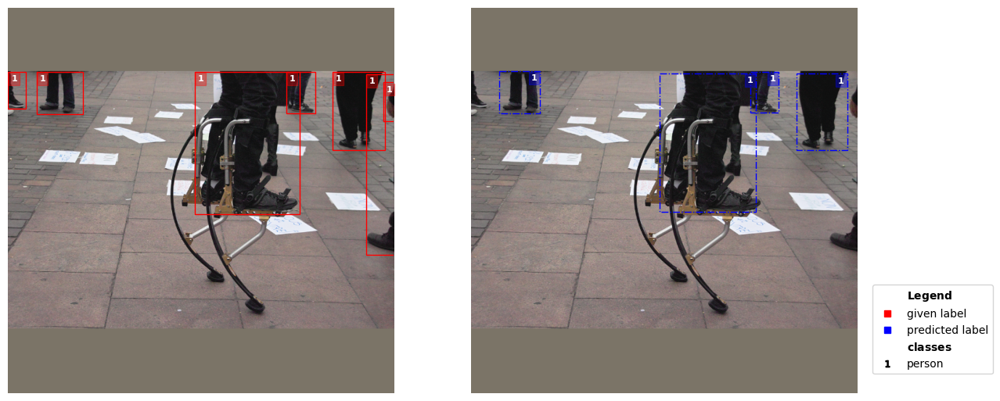

/workspace/yolo_v8_training/oiv7_full/validation/019e5df10a052b49.jpg | idx 48 | label quality score: 0.3271661363510433 | is issue: True


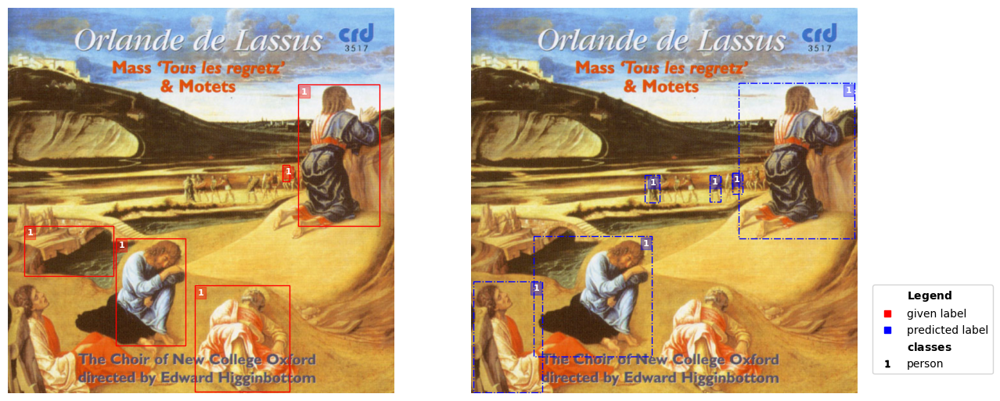

/workspace/yolo_v8_training/oiv7_full/validation/03287ba254e82b37.jpg | idx 22 | label quality score: 0.3272598131336175 | is issue: True


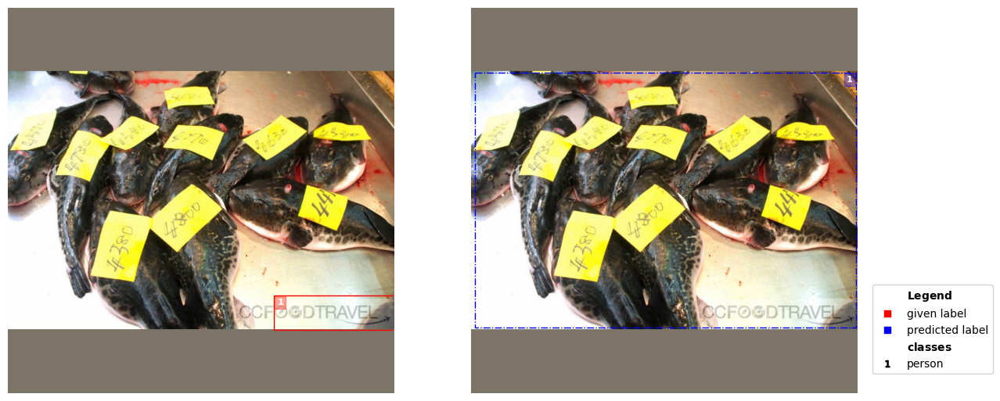

/workspace/yolo_v8_training/oiv7_full/validation/0ca4cd34574b30be.jpg | idx 62 | label quality score: 0.3289650045208251 | is issue: True


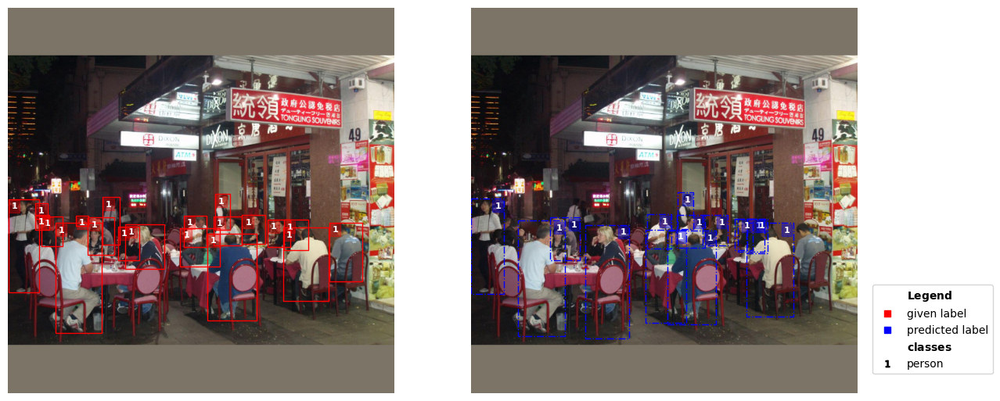

/workspace/yolo_v8_training/oiv7_full/validation/0607016e56a8f793.jpg | idx 132 | label quality score: 0.3292102195871707 | is issue: True


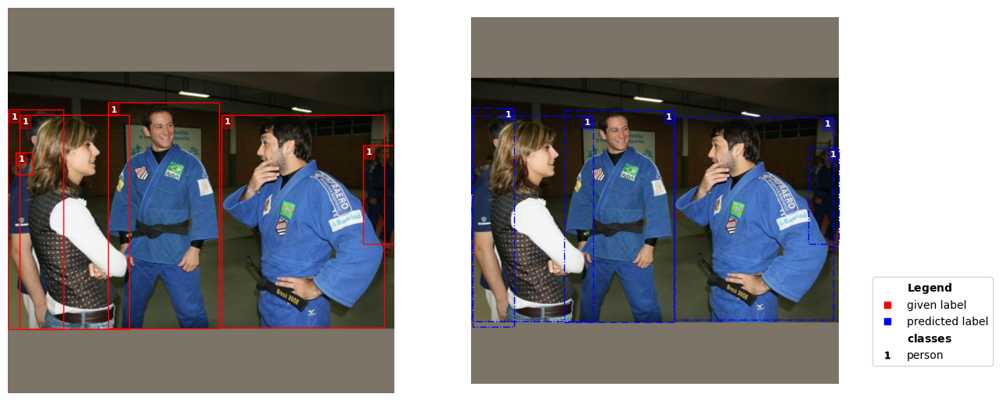

/workspace/yolo_v8_training/oiv7_full/validation/01e714e8fbbc0d0c.jpg | idx 83 | label quality score: 0.34953764146292166 | is issue: True


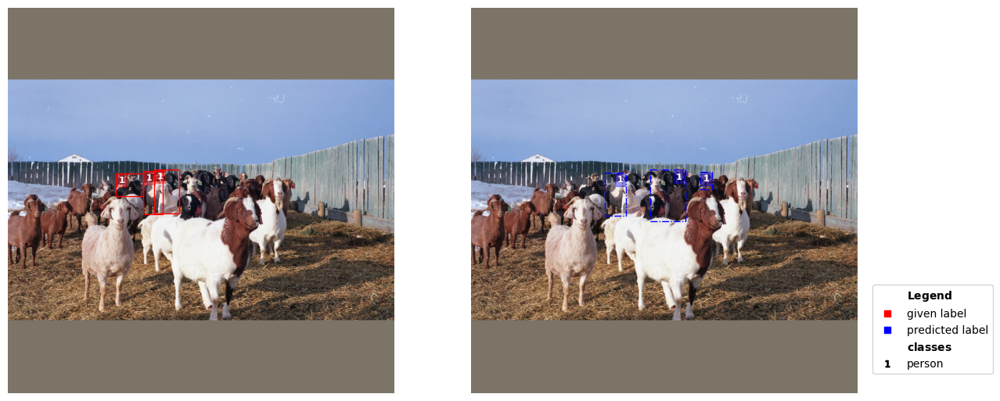

/workspace/yolo_v8_training/oiv7_full/validation/0047534bb816eb48.jpg | idx 179 | label quality score: 0.3690050946759662 | is issue: True


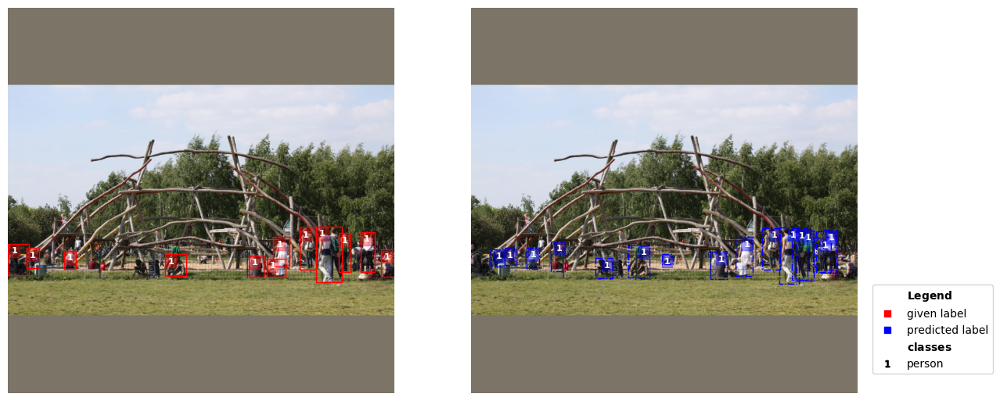

/workspace/yolo_v8_training/oiv7_full/validation/0f425a184b11200d.jpg | idx 124 | label quality score: 0.3695091816414584 | is issue: True


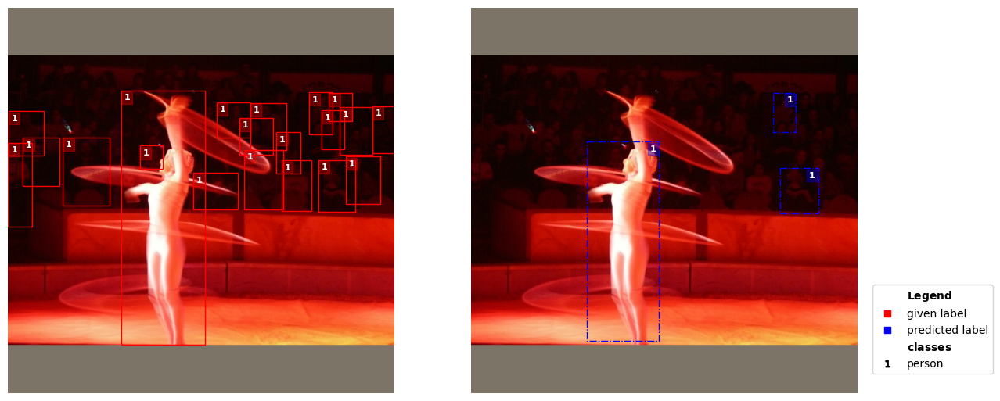

/workspace/yolo_v8_training/oiv7_full/validation/00d33e05424ff8cc.jpg | idx 11 | label quality score: 0.3757388239276668 | is issue: True


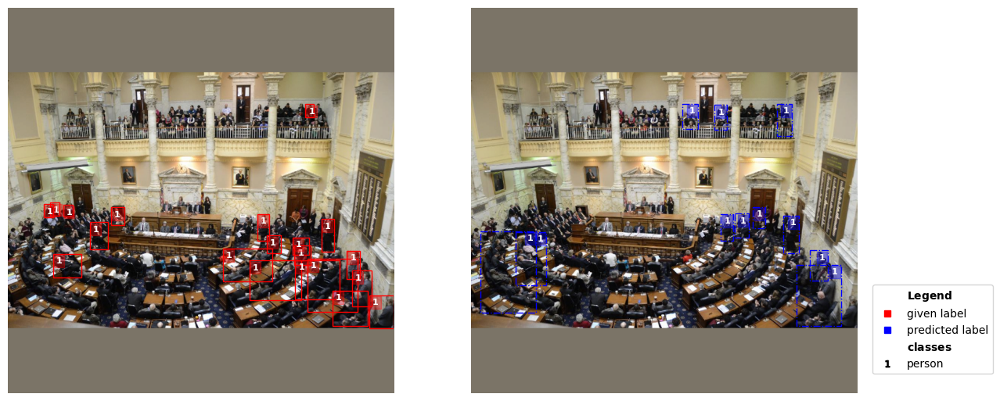

/workspace/yolo_v8_training/oiv7_full/validation/067a9099e8f3a727.jpg | idx 18 | label quality score: 0.3795479962621546 | is issue: True


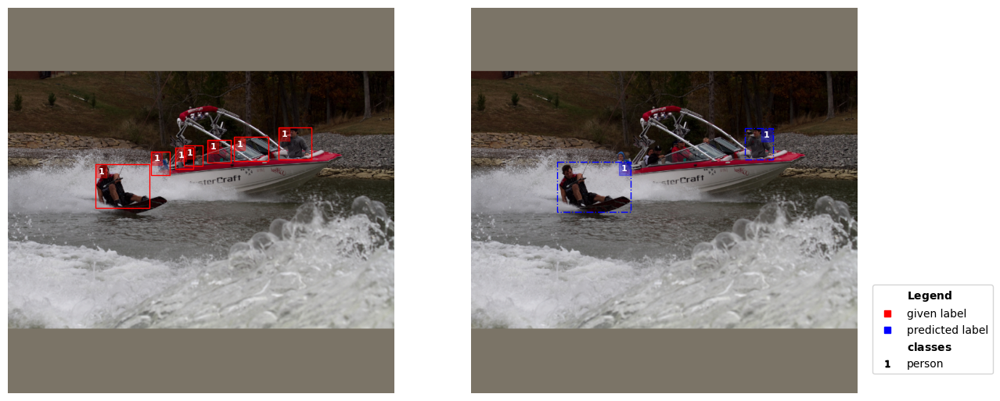

/workspace/yolo_v8_training/oiv7_full/validation/00ccda615ec9731d.jpg | idx 175 | label quality score: 0.39650361410791174 | is issue: True


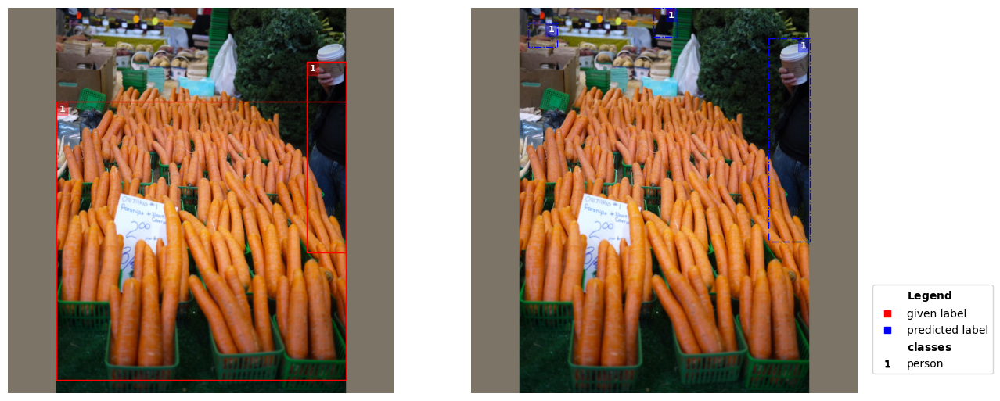

/workspace/yolo_v8_training/oiv7_full/validation/0de22ef51a38c275.jpg | idx 152 | label quality score: 0.4019775693567288 | is issue: True


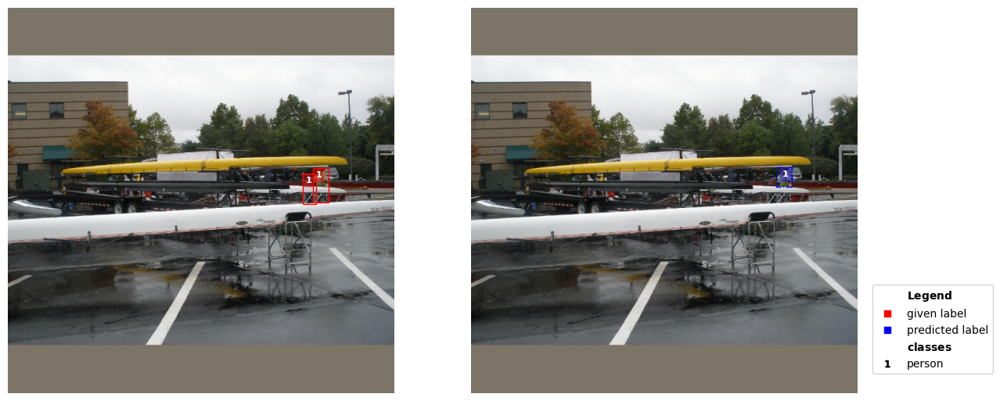

In [76]:
class_names = {"1": "person"}
IMAGE_PATH = '/workspace/yolo_v8_training/oiv7_full/validation/'

for i in range(20):  # iterate from 0 to 9 (inclusive)
    issue_to_visualize = issue_idx[i]  # use the index variable i
    
    label = labels[issue_to_visualize]
    prediction = predictions[issue_to_visualize]
    score = scores[issue_to_visualize]
    image_path = IMAGE_PATH + label['seg_map']

    image = label['img']

    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    inverse_normalize = tfms.A.Normalize(mean=[-m/s for m, s in zip(mean, std)], std=[1/s for s in std],
                                        always_apply=True, max_pixel_value=1.0)

    inverse_normalized_image = (inverse_normalize(image=image)['image']*255).astype(np.uint8)
    
    print(image_path, '| idx', issue_to_visualize, '| label quality score:', score, '| is issue: True')
    
    visualize(inverse_normalized_image, label=label, prediction=prediction, class_names=class_names, overlay=False)